<a href="https://colab.research.google.com/github/christianlozano99/ChristianLozano/blob/master/LinearRegression_HouseCostPredictor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#### **Christian Lozano Assigment 2 Spring 2021**


### **Load in data from CSV Files**


*   Load CSV file sfor testing and training
*   Import some basic libraies such as pandas and numpy



**Fufilled Requiments on this cell:**
1. You must load the data from provided CSV files

In [ ]:
import numpy as np 
import pandas as pd
import pylab as plt
import seaborn as sns
import missingno as msno 
from sklearn.metrics import f1_score, accuracy_score, roc_auc_score
from sklearn import linear_model


from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error





testDF = pd.read_csv('test.csv')
trainDF = pd.read_csv('train.csv')
trainDF

,id,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,0,-122.22,37.77,40.0,494.0,114.0,547.0,135.0,2.8015,NEAR BAY,114800.0
1,1,-122.29,37.76,18.0,2873.0,763.0,1243.0,663.0,5.1702,NEAR BAY,265400.0
2,2,-118.48,34.23,29.0,3354.0,707.0,1752.0,650.0,4.5484,<1H OCEAN,239900.0
3,3,-122.19,37.80,48.0,1694.0,259.0,610.0,238.0,4.7440,NEAR BAY,257300.0
4,4,-121.93,36.63,33.0,1740.0,342.0,638.0,329.0,3.1912,NEAR OCEAN,319800.0
5,5,-122.06,37.64,33.0,1160.0,252.0,729.0,220.0,3.8259,NEAR BAY,146100.0
6,6,-117.94,33.77,32.0,714.0,142.0,654.0,154.0,4.5052,<1H OCEAN,170800.0
7,7,-117.93,33.90,30.0,2629.0,331.0,956.0,319.0,9.9071,<1H OCEAN,500001.0
8,8,-117.39,34.13,9.0,2228.0,398.0,1316.0,370.0,4.1632,INLAND,119800.0
9,9,-118.21,34.21,41.0,1676.0,263.0,757.0,255.0,4.7734,<1H OCEAN,450800.0


In [ ]:
testDF

,id,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity
0,0,-122.36,37.94,41.0,2591.0,585.0,1638.0,462.0,1.8220,NEAR BAY
1,1,-118.37,34.16,17.0,4150.0,1148.0,1808.0,1041.0,3.5051,<1H OCEAN
2,2,-118.29,33.95,40.0,2808.0,695.0,2357.0,627.0,1.9655,<1H OCEAN
3,3,-121.77,38.01,13.0,2983.0,534.0,1417.0,510.0,3.9861,INLAND
4,4,-118.26,34.08,45.0,2174.0,627.0,1992.0,557.0,2.5428,<1H OCEAN
5,5,-121.98,37.36,33.0,1582.0,272.0,809.0,267.0,5.7059,<1H OCEAN
6,6,-121.14,37.47,38.0,2427.0,450.0,1272.0,474.0,2.8833,INLAND
7,7,-119.81,36.73,50.0,772.0,194.0,606.0,167.0,2.2206,INLAND
8,8,-119.14,34.15,25.0,2202.0,390.0,1415.0,412.0,4.4300,NEAR OCEAN
9,9,-121.42,38.22,35.0,1507.0,313.0,868.0,283.0,2.0284,INLAND


### **Preprocessing Data**
Dropping id column from the test data and training data and looking to see if theres any missing data segments. Since it return 110 and 97 I will further invasgiate if its in many columns or one.

**Fufilled Requiments on following cells:**
2. You must check for missing values within the training data.
3. If the training data contains missing values, you must describe and implement an approach to handle those missing values.

Checking for null variables

In [ ]:
trainDF = trainDF.drop('id', axis = 1)
testDF = testDF.drop('id', axis = 1)

print(trainDF.isnull().sum().sum())
print(testDF.isnull().sum().sum())

110
97


Found out it has missing data only in Total bedrooms column in both tables.

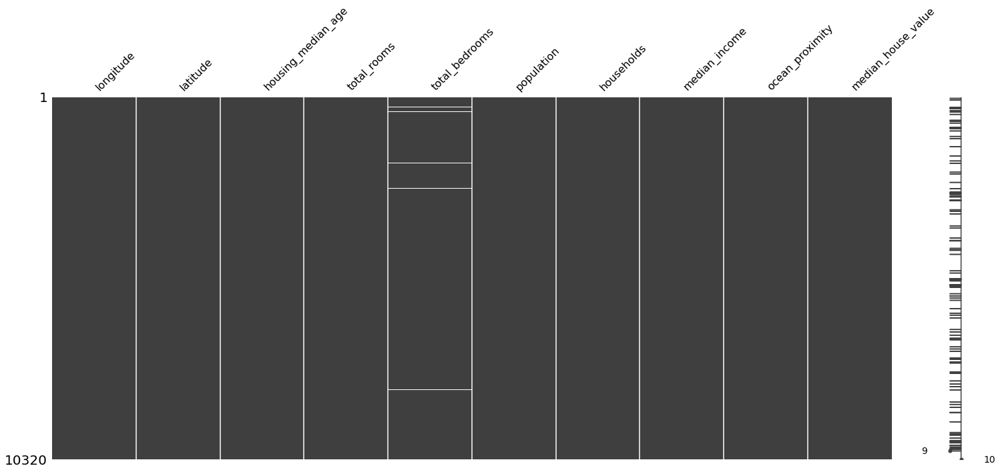

In [ ]:
msno.matrix(trainDF)

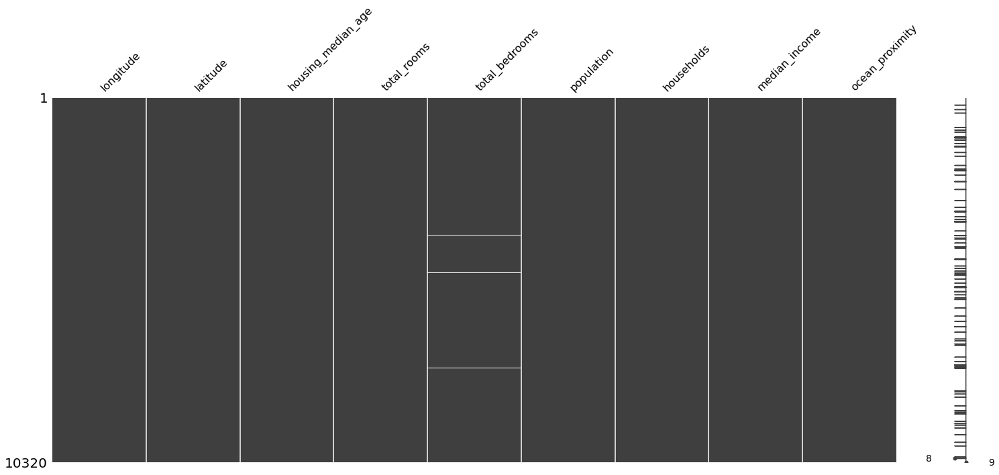

In [ ]:
msno.matrix(testDF)

Since our target varaible will be to estimate a median I decided to replace the missing datat with the median value of the dataframes.

In [ ]:
testDF["total_bedrooms"] = testDF["total_bedrooms"].replace(np.NaN, testDF["total_bedrooms"].median())
trainDF["total_bedrooms"] = trainDF["total_bedrooms"].replace(np.NaN, trainDF["total_bedrooms"].median())

print(testDF.isnull().sum().sum())
print(trainDF.isnull().sum().sum())

0
0


I also saw that our data has a column which is ocean proximity, that are strings that need to be labled discretely so the computer can understand and the method I choose was to do a hot ones encoding.

In [ ]:
possibleResults = testDF['ocean_proximity'].unique()
possibleResults2 = trainDF['ocean_proximity'].unique()
print(possibleResults)
print(possibleResults2)

['NEAR BAY' '<1H OCEAN' 'INLAND' 'NEAR OCEAN' 'ISLAND']
['NEAR BAY' '<1H OCEAN' 'NEAR OCEAN' 'INLAND' 'ISLAND']


I decided that since there arent many diffrent options that I would give each their own coulmn so basically doing a hot ones encoding but accross several columns.

In [ ]:
one_hot = pd.get_dummies(testDF['ocean_proximity'])
testDF = testDF.drop('ocean_proximity',axis = 1)
testDF = testDF.join(one_hot)
print(testDF)

one_hot = pd.get_dummies(trainDF['ocean_proximity'])
trainDF = trainDF.drop('ocean_proximity',axis = 1)
trainDF = trainDF.join(one_hot)
print(trainDF)

       longitude  latitude  housing_median_age  total_rooms  total_bedrooms  \
0        -122.36     37.94                41.0       2591.0           585.0   
1        -118.37     34.16                17.0       4150.0          1148.0   
2        -118.29     33.95                40.0       2808.0           695.0   
3        -121.77     38.01                13.0       2983.0           534.0   
4        -118.26     34.08                45.0       2174.0           627.0   
5        -121.98     37.36                33.0       1582.0           272.0   
6        -121.14     37.47                38.0       2427.0           450.0   
7        -119.81     36.73                50.0        772.0           194.0   
8        -119.14     34.15                25.0       2202.0           390.0   
9        -121.42     38.22                35.0       1507.0           313.0   
10       -117.91     34.10                28.0       3694.0           722.0   
11       -117.17     33.83                 7.0      

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



**Outliers**

Here I looked at the box plots generated I did not drop any outliars because the plots seemed fairly distributed. I also decided not to implement standardization or normalization because the reggression weights wouldnt be affected due to the equation that calculates the weights. (it would not change the result so theres no point)

**Fufilled Requiments on this cell:**

4. You must check for outliers within the training data.
5. If the training data contains outliers, you must describe and implement an approach to handle those outliers.
6. You must determine whether or not you will implement normalization or standardization, and explain your decision.

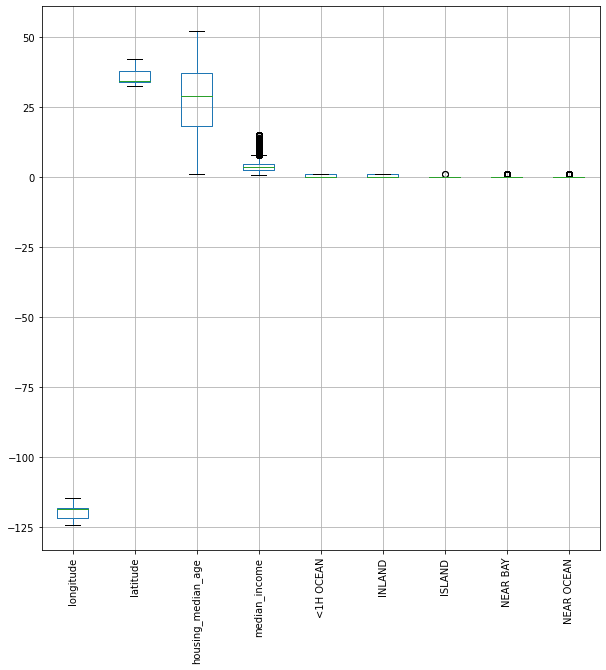

In [ ]:
trainDF.loc[:, trainDF.columns[trainDF.max()<=100].to_list()].boxplot(figsize=(10,10),rot =90)

###**Picking a Model**
Options and why I didnt or did choose them.
* Ordinary Least Squares Regression
 * Going with this one because we are just looking for the median based on weights so this would keep the output calculation basic.
* Ridge Regression
 * I am not using Ridge regression because, its used when the number of predictor variables in a set exceeds the number of observations and our test size is the same as our train size.
* Lasso Regression
 * Not using Lasso reggression either because it shrinks our data values so isn't ideal for median and used more for things like mean.
* ElasticNet Regression
 * Simular to Lasso Reggression in that it is a comboation of lasso and ridge so I will not be using it either.

In [ ]:
y = trainDF['median_house_value']
X = trainDF.drop('median_house_value',axis = 1)

###**Analysis to Optimize Regression Modle**

I decided to check what my RMSE looked like based on my train test split. based on that I use what ever value had the lowest one to train my data based on that split.


**Fufilled Requiments on this cell:**

7. You must build and train a linear regression model on the training data.
Be aware that sklearn has multiple linear regression models. You will need to find the one that works best.
8. You must plot the sampling distribution for the RMSE for each model that you build in your notebook.

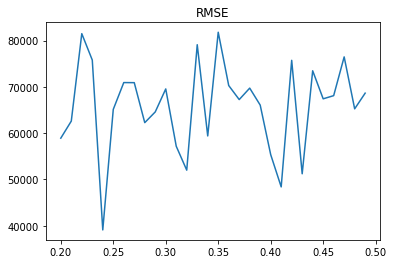

RMSE 39082.28187600535 at split 0.24


In [ ]:
results = []
for n in range (20,50):
  X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = n )
  reg = linear_model.LinearRegression()

  reg.fit(X_train, y_train)
  y_pred = reg.predict(X_test)
  rms = mean_squared_error(y_test, y_pred, squared=False)

  results.append([n/100, rms])

results = pd.DataFrame(results, columns=["n", "rms"])
plt.plot(results.n, results.rms)
plt.title("RMSE")
plt.show()
meq = results.idxmin()
print('RMSE',results.rms[meq.rms], 'at split',results.n[meq.rms])

Training the modle with lowest RMSE training split value.

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = results.n[meq.rms])
  reg = linear_model.LinearRegression()

  reg.fit(X_train, y_train)
  y_pred = reg.predict(X_test)

###**Predicting the target vector**
Predicting what will be the output of the test file.

**Fufilled Requiments on this cell:**
9. You must predict the target vector for the test data (from test.csv) using your model.
10. I displayed the output for my predicted target vector this made me get a  68566.77011 on kaggle.

In [ ]:
y_predict = reg.predict(testDF)

submission = pd.DataFrame({"median_house_value": y_predict})
submission.to_csv('submission.csv', index =True, index_label = 'id')
pd.set_option("display.max_rows", None, "display.max_columns", None)
print(submission)

       median_house_value
0           161449.534712
1           261477.130519
2           149767.959643
3           167393.322378
4           180527.319260
5           307241.877929
6           148713.494088
7           110485.180061
8           254130.027282
9            95511.928499
10          190316.382240
11          156710.947838
12          223113.842802
13          134121.907696
14          253826.486925
15          221920.283512
16          368876.040553
17          123329.995077
18          144642.492807
19          270948.696448
20          312779.172278
21          491732.740078
22          101988.224055
23           64857.813773
24          168338.090123
25          156347.036993
26          125027.442404
27          296866.697666
28          142068.544563
29          201566.690414
30           55244.559885
31          290503.363473
32          205471.797645
33          289065.467780
34          238270.173765
35           77096.518097
36          252697.084882
37          